In [1]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
import json
import skimage.io
import skimage.draw

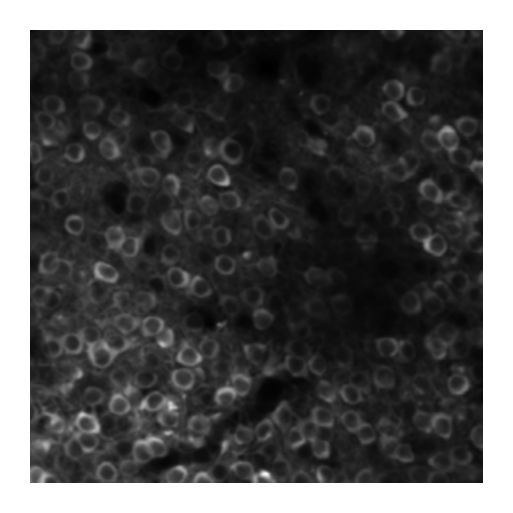

In [16]:
# I will download images from website
urls = ['http://www.cellpose.org/static/images/img02.png',
        'http://www.cellpose.org/static/images/img03.png',
        'http://www.cellpose.org/static/images/img05.png']
files = []
for url in urls:
    parts = urlparse(url)
    filename = os.path.basename(parts.path)
    if not os.path.exists(filename):
        sys.stderr.write('Downloading: "{}" to {}\n'.format(url, filename))
        utils.download_url_to_file(url, filename)
    files.append(filename)

# REPLACE FILES WITH YOUR IMAGE PATHS
# files = ['img0.tif', 'img1.tif']

# view 1 image
img = io.imread(files[-1])
plt.figure(figsize=(2,2))
plt.imshow(img)
plt.axis('off')
plt.show()

In [17]:
# RUN CELLPOSE

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=False, model_type='cyto')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

# you can run all in a list e.g.
# >>> imgs = [io.imread(filename) in files]
# >>> masks, flows, styles, diams = model.eval(imgs, diameter=None, channels=channels)
# >>> io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
# >>> io.save_to_png(imgs, masks, flows, files)

# or in a loop
for chan, filename in zip(channels, files):
    img = io.imread(filename)
    masks, flows, styles, diams = model.eval(img, diameter=None, channels=chan)

    # save results so you can load in gui
    io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)

    # save results as png
    io.save_to_png(img, masks, flows, filename)

>>>> using CPU
Running test snippet to check if MKL-DNN working
see https://pytorch.org/docs/stable/backends.html?highlight=mkl
** MKL version working - CPU version is sped up. **
processing 1 image(s)
computing styles from images
time spent: running network 1.72s; flow+mask computation 0.68
estimated cell diameters for 1 image(s) in 4.00 sec
>>> diameter(s) =  [29.38115358]
time spent: running network 7.24s; flow+mask computation 0.89
estimated masks for 1 image(s) in 8.13 sec
>>>> TOTAL TIME 12.14 sec
processing 1 image(s)
computing styles from images
time spent: running network 1.10s; flow+mask computation 0.40
estimated cell diameters for 1 image(s) in 2.86 sec
>>> diameter(s) =  [33.17679957]
time spent: running network 4.66s; flow+mask computation 0.49
estimated masks for 1 image(s) in 5.16 sec
>>>> TOTAL TIME 8.02 sec
processing 1 image(s)
computing styles from images
time spent: running network 4.10s; flow+mask computation 1.42
estimated cell diameters for 1 image(s) in 8.80 se

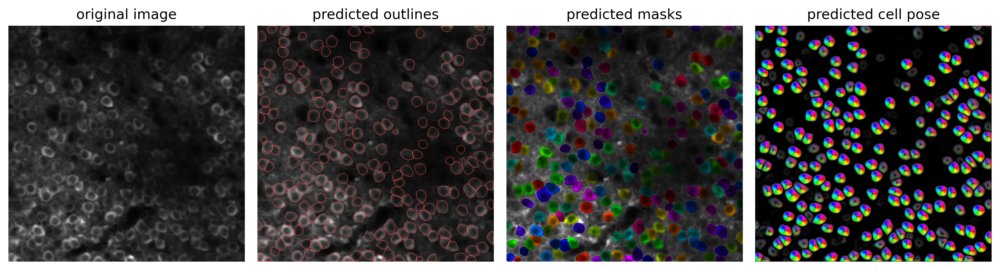

In [18]:
# DISPLAY RESULTS
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img, masks, flows[0], channels=chan)
plt.tight_layout()
plt.show()

In [19]:
!ls

Cellpose_2D_v0_1.ipynb	img03_cp_outlines.txt  img05.png
img02_cp_masks.png	img03_cp_output.png    img05_seg.npy
img02_cp_outlines.txt	img03.png	       run_cellpose_GPU.ipynb
img02_cp_output.png	img03_seg.npy	       run_cellpose.ipynb
img02.png		img05_cp_masks.png     val
img02_seg.npy		img05_cp_outlines.txt
img03_cp_masks.png	img05_cp_output.png


In [20]:
val = [file for file in os.listdir('val') if '.png' in file]
channels = [2,0]

In [21]:
val

['Q_nst_m13_20201210.png',
 'L_st_m13_20201216.png',
 'wt_st_m13_20201210.png',
 'Q_nst_m13_20201216.png',
 'L_st_m13_20201211.png',
 'Q_st_m13_20201209.png',
 'wt_nst_m13_20201209.png',
 'wt_nst_m13_20201211.png']

In [22]:
imgs = [io.imread('val/'+filename) for filename in val]
masks, flows, styles, diams = model.eval(imgs, diameter=None, channels=channels)
io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
io.save_to_png(imgs, masks, flows, files)

processing 8 image(s)


  0%|          | 0/8 [00:00<?, ?it/s]

computing styles from images


100%|██████████| 8/8 [01:17<00:00,  9.67s/it]


time spent: running network 63.36s; flow+mask computation 13.73
estimated cell diameters for 8 image(s) in 132.65 sec
>>> diameter(s) =  [39.91018254 35.2516921  37.47510131 32.97493853 38.87772046 31.63363559
 18.77847271 31.89527295]


100%|██████████| 8/8 [03:41<00:00, 27.65s/it]


time spent: running network 210.16s; flow+mask computation 11.00
estimated masks for 8 image(s) in 221.37 sec
>>>> TOTAL TIME 354.03 sec


In [44]:
flows[0][0].shape

(769, 769, 3)

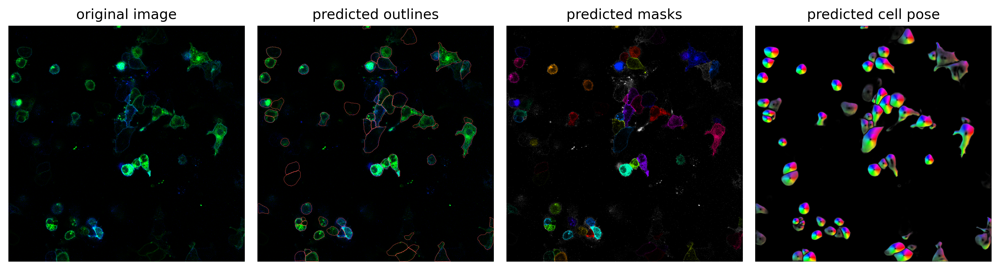

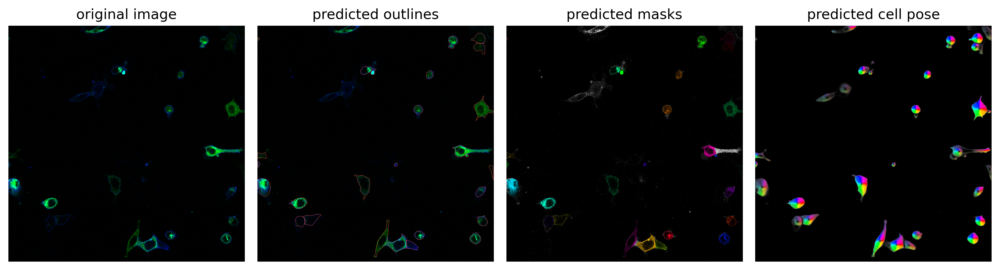

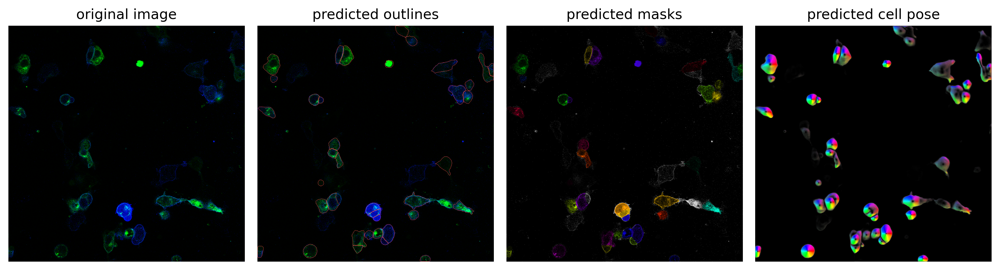

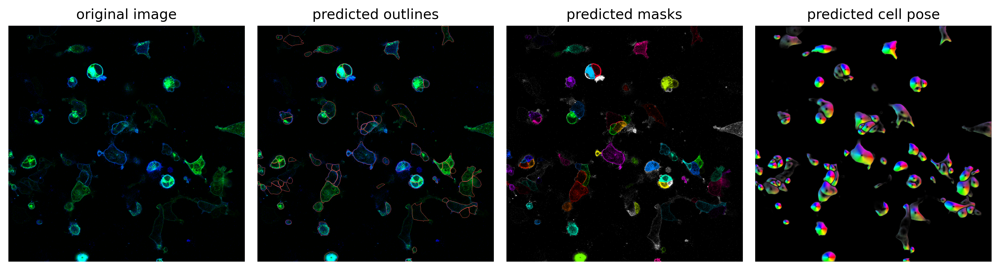

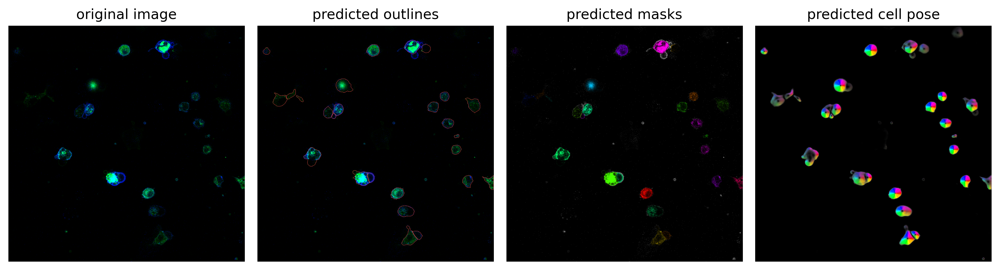

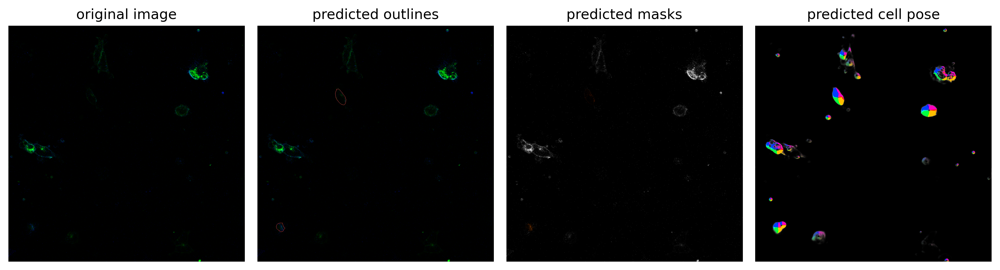

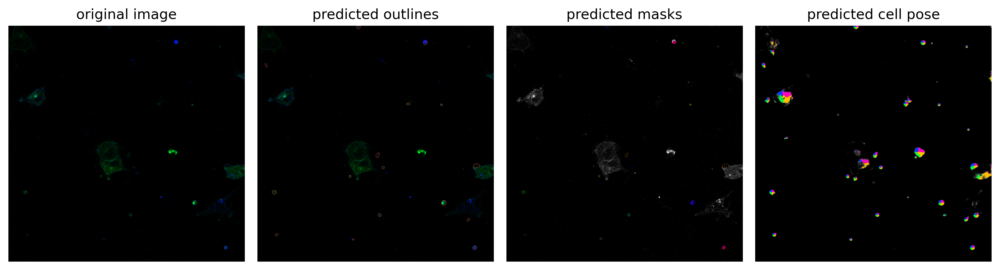

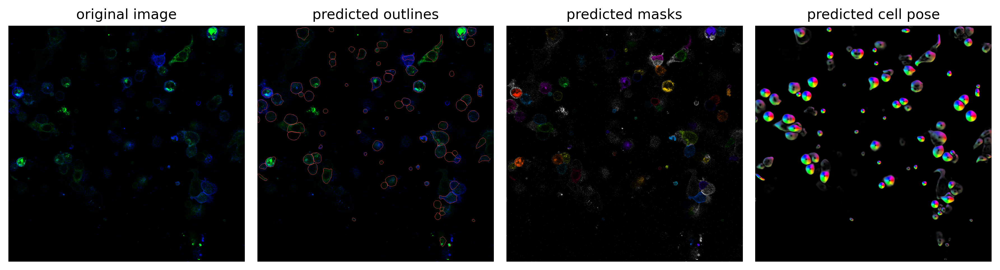

In [8]:
# DISPLAY RESULTS
for i, img in enumerate(imgs):
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, img, masks[i], flows[i][0], channels=channels)
    plt.tight_layout()
    plt.show()